In [1]:
import scipy
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import seaborn.objects as so
import symphonypy as sp

from ete3 import TreeStyle, Tree, TextFace, add_face_to_node

sc.set_figure_params(dpi=300, scanpy=True)
sc.settings.verbosity = 3
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import os
# change it according to your preferences
DATA_DIR = "/n/groups/kirschner/xenopus/old_atlas"
NF_stage = "S8"
# adata_kotov_fp = os.path.join(DATA_DIR, "GSE198491_matrix.h5ad")
adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.h5ad")
# adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.intron_exon.h5ad")
# adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")


os.environ['QT_QPA_PLATFORM']='offscreen'

In [3]:
import sys
sys.path.append("/home/ksp503/projs/xenopus/notebooks")

from little import *

In [4]:
# adata.uns['log1p']["base"] = None

# DE marker gene determination for Briggs cell types

In [4]:
adata = sc.read_h5ad(adata_fp)

In [5]:
REF_DIR = "/n/groups/kirschner/xenopus/reference/Xentr10.0"

gtf_ids = pd.read_csv(os.path.join(REF_DIR, "XENTR_10.0_Xenbase.names.tsv"), sep="\t")
gtf_ids[["eval_forward", "eval_backward"]] = gtf_ids[["eval_forward", "eval_backward"]].astype(float)
gtf_ids_unique = gtf_ids.sort_values("eval_forward").drop_duplicates("gene_id")
cols = ["gene_name", "human_id", "human_name", "human_desc", "eval_forward", "eval_backward"]
adata.var[cols] = gtf_ids_unique.set_index("gene_id").loc[adata.var_names, cols].values
adata.var[["eval_forward", "eval_backward"]] = adata.var[["eval_forward", "eval_backward"]].astype(float)

In [7]:
adata.raw = adata.copy()

In [6]:
adata.obs["Celltype_transferred"].value_counts()

Celltype_transferred
Unknown          38723
S08-blastula      1179
S08-germ cell        5
Name: count, dtype: int64

In [7]:
unlabeled = "Unlabeled"

reannotate_dict = {
    "germ cell": unlabeled,
    "Unknown": unlabeled,
    "Outlier": unlabeled,
}

train_target_long = "Celltype_transferred"
# adata_train.obs[train_target] = adata_train.obs["Celltype_transferred"].astype("str")
# adata_train.obs.loc[~adata_train.obs.consistent, train_target] = "Unknown"

train_target = f"{train_target_long}_short"
adata.obs[train_target] = adata.obs[train_target_long].str.replace(f"S08-", "")
adata.obs[train_target] = adata.obs[train_target].astype("category")

celltype_barcode = "Celltype_barcode"
adata.obs[celltype_barcode] = adata.obs[train_target]

adata.obs[train_target] = [reannotate_dict[ct] if ct in reannotate_dict else ct for ct in adata.obs[train_target]]
adata.obs[train_target] = adata.obs[train_target].astype("category")

In [8]:
adata.obs_names_make_unique()

In [153]:
# adata = adata.raw.to_adata()

In [154]:
sc.experimental.pp.recipe_pearson_residuals(adata, n_top_genes=1000, theta=10, batch_key="Library_name", n_comps=30)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
computing analytic Pearson residuals on adata.X
    finished (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:03)


In [155]:
adata.raw = adata.copy()

In [156]:
sc.pp.normalize_total(adata, target_sum=1e5)
sc.pp.log1p(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

normalizing counts per cell
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


In [160]:
res = 2
cur_leiden = f"leiden_{res}"
sc.tl.leiden(adata, resolution=res, key_added=cur_leiden)

running Leiden clustering
    finished: found 71 clusters and added
    'leiden_2', the cluster labels (adata.obs, categorical) (0:00:01)


/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


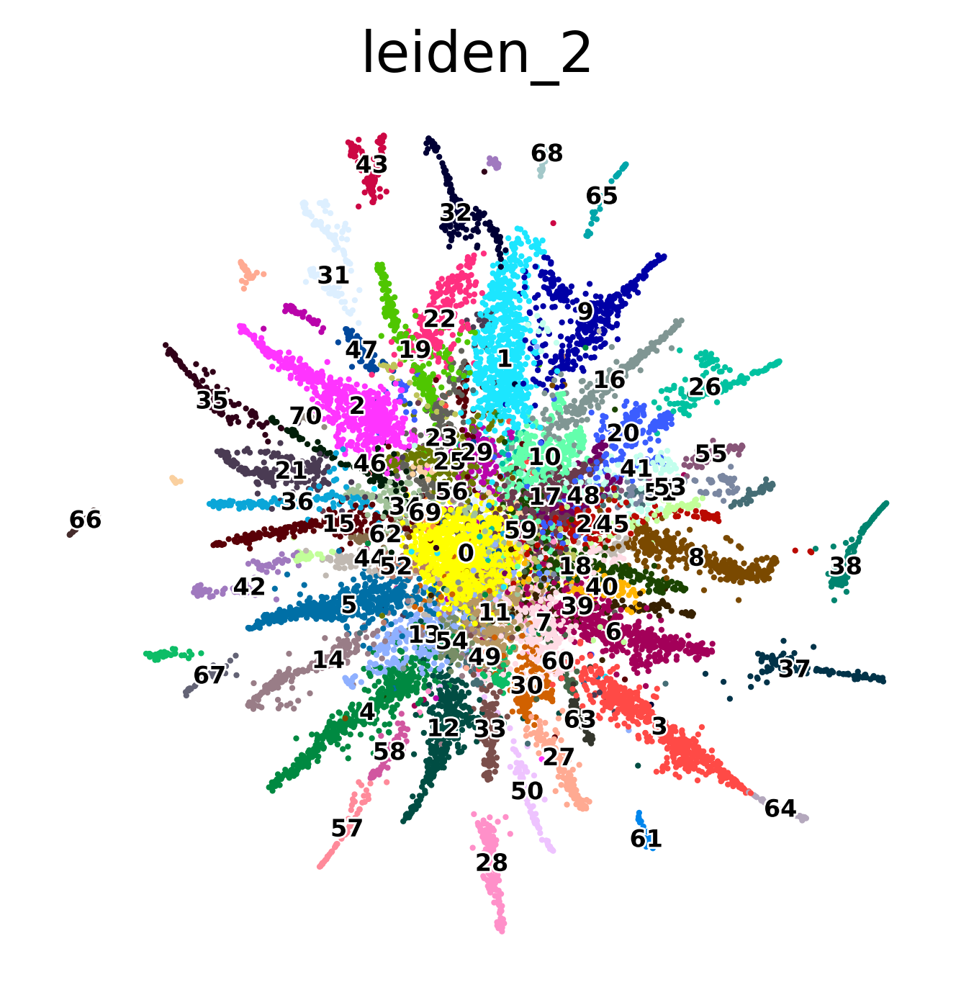

In [161]:
sc.set_figure_params(dpi=200)
sc.pl.umap(
    adata,
    color=cur_leiden,
    legend_loc="on data",
    legend_fontsize=6,
    legend_fontoutline=1,
    frameon=False,
)

# Assessment of annotation of clusters
- celltype entropy -> undetermined cluster
- number of strong marker genes ~ cluster goodness
- fraction of celltype max -> subtype?

In [128]:
method = "wilcoxon"
logfoldchange = 2
p_adj = 0.05
pct = 0.6

sc.tl.rank_genes_groups(adata, cur_leiden, method=method, use_raw=False, key_added=cur_leiden, pts=True)

ranking genes
    finished: added to `.uns['leiden_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:11)


In [15]:
cluster_marker_genes = {}

for cluster in adata.obs[cur_leiden].cat.categories:
    mg_df = sc.get.rank_genes_groups_df(adata, group=cluster, key=cur_leiden)
    mg_df = mg_df.loc[(mg_df.logfoldchanges > logfoldchange) & (mg_df.pvals_adj < p_adj) & (mg_df.pct_nz_group > pct)]
    cluster_marker_genes[cluster] = mg_df

In [16]:
cluster2cell_type = pd.DataFrame(
    {
        "cluster": adata.obs[cur_leiden].cat.categories,
        f"mg_num_{logfoldchange}_{p_adj}_{pct}": [cluster_marker_genes[cluster].shape[0] for cluster in adata.obs[cur_leiden].cat.categories]
    }
)

In [17]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    display(cluster2cell_type)

,cluster,mg_num_2_0.05_0.6
0,0,0
1,1,1
2,2,1
3,3,1
4,4,0
5,5,1
6,6,1
7,7,0
8,8,0
9,9,1


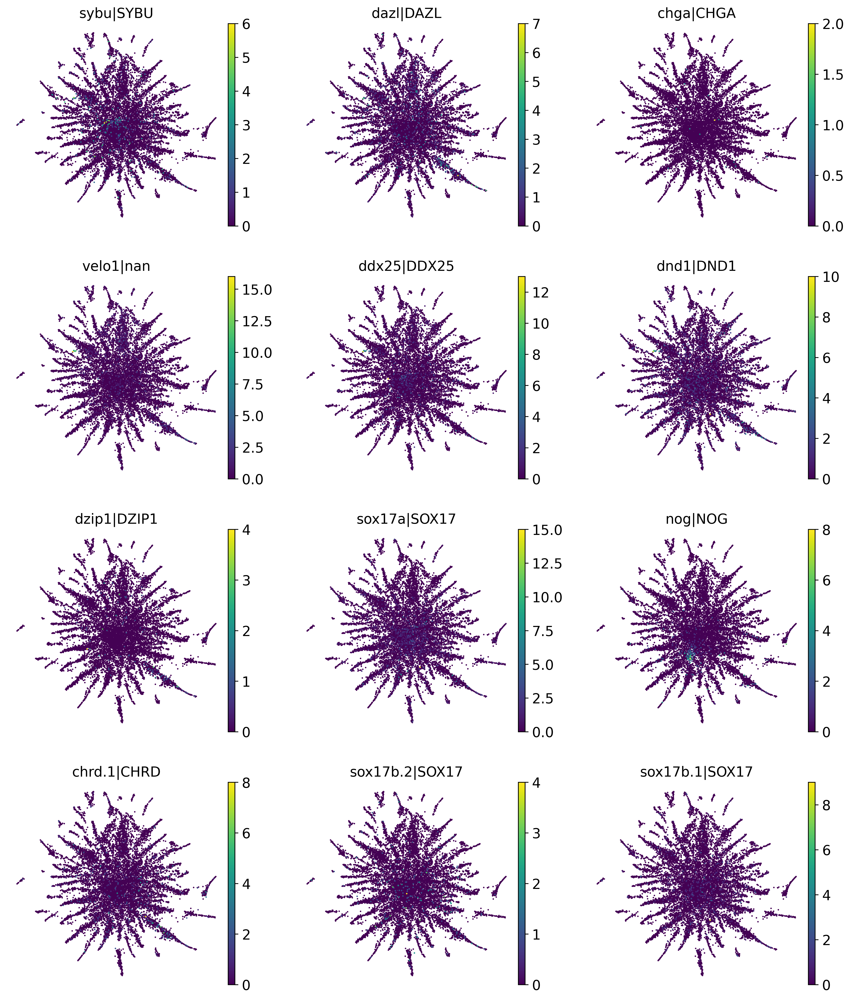

In [159]:
genes = ["ddx25", "dazl", "sybu", "dnd1", "nog", "nog2", "chga", "sox17a", "sox17b.2", "sox17b.1", "chrd.1", "dzip1", "velo1"]
color = adata.var_names[adata.var["gene_name"].isin(genes)]
names = adata.var.loc[adata.var["gene_name"].isin(genes), "gene_name"].astype("str") + "|" \
    + adata.var.loc[adata.var["gene_name"].isin(genes), "human_name"].astype("str")
sc.pl.umap(adata, color=color, frameon=False, ncols=3, use_raw=True, title=names)

# Cluster explore

In [162]:
sc.tl.rank_genes_groups(
    adata, cur_leiden, method='wilcoxon', use_raw=False, key_added=cur_leiden
)

ranking genes
    finished: added to `.uns['leiden_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:54)


In [50]:
groups = ["16", ]
reference = "13"
key_added = f"{','.join(groups)} vs {reference}"

In [51]:
sc.tl.rank_genes_groups(
    adata, cur_leiden, method='wilcoxon', use_raw=False,
    groups=groups,
    reference=reference,
    key_added=key_added
)

ranking genes
    finished: added to `.uns['16 vs 13']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [28]:
gene_symbols = "gene_name_display"
marker_genes = sc.get.rank_genes_groups_df(adata, group=groups, gene_symbols=gene_symbols, key=key_added)

NameError: name 'groups' is not defined

In [ ]:
sc.set_figure_params(dpi=150)
ntop = nbottom = 5
use_raw = True

adata.obs["cur_cluster"] = "others"

marker_genes_top = []
marker_genes_bottom = []
marker_genes_top_symbols = []
marker_genes_bottom_symbols = []

if len(groups) > 1:
    for group in groups:
        adata.obs.loc[adata.obs[cur_leiden] == group, "cur_cluster"] = f"group_{group}"
        marker_genes_top += list(marker_genes.loc[marker_genes.group == group, "names"][:ntop])
        marker_genes_top_symbols += list(marker_genes.loc[marker_genes.group == group, gene_symbols][:ntop])
        marker_genes_bottom += list(marker_genes.loc[marker_genes.group == group, "names"][-nbottom:])
        marker_genes_bottom_symbols += list(marker_genes.loc[marker_genes.group == group, gene_symbols][-nbottom:])
else:
    adata.obs.loc[adata.obs[cur_leiden] == groups[0], "cur_cluster"] = f"group_{groups[0]}"
    marker_genes_top += list(marker_genes["names"][:ntop])
    marker_genes_top_symbols += list(marker_genes[gene_symbols][:ntop])
    marker_genes_bottom += list(marker_genes["names"][-nbottom:])
    marker_genes_bottom_symbols += list(marker_genes[gene_symbols][-nbottom:])
    
adata.obs.loc[adata.obs[cur_leiden] == reference, "cur_cluster"] = f"reference_{reference}"

    
colors = ["cur_cluster"] + marker_genes_top + marker_genes_bottom 
titles = [key_added] + marker_genes_top_symbols + marker_genes_bottom_symbols

sc.pl.umap(
    adata,
    color=colors,
    title=titles,
    frameon=False,
    ncols=3,
    use_raw=use_raw
#     vmax=[30, 10, 40, 20]
)

In [51]:
adata.obs.loc[adata.obs[cur_leiden].isin(groups+[reference,]), [cur_leiden, celltype_barcode]].value_counts().sort_index()

leiden_3  Celltype_barcode                 
19        S18-chordal neural crest              80
          S18-cranial neural crest             276
          Unknown                                2
53        Outlier                                1
          S18-anterior placodal area             1
          S18-chordal neural crest               5
          S18-cranial neural crest              79
          S18-endoderm / foregut primordium      1
          Unknown                                4
Name: count, dtype: int64

In [163]:
adata.var["gene_id"] = adata.var_names.to_series()
gene_name = "gene_name_display"
adata.var[gene_name] = adata.var.gene_id.astype("str")
idx = ~adata.var.gene_name.isna()
adata.var.loc[idx, gene_name] += "|" + adata.var.loc[idx, "gene_name"].astype("str")
idx = ~adata.var.human_name.isna()
adata.var.loc[idx, gene_name] += "|" + adata.var.loc[idx, "human_name"].astype("str")

adata.var[gene_name]

XBXT10g000001        XBXT10g000001|nsfl1c|NSFL1C
XBXT10g000002          XBXT10g000002|clul1|CLUL1
XBXT10g000003          XBXT10g000003|vwc2l|VWC2L
XBXT10g000004      XBXT10g000004|slc47a1|SLC47A1
XBXT10g000005          XBXT10g000005|ikbkg|IKBKG
                              ...               
XBXT10g029550    XBXT10g029550|LOC105945311|CASR
XBXT10g029555         XBXT10g029555|LOC116409744
XBXT10g029560    XBXT10g029560|LOC116406866|CRNN
XBXT10g029570      XBXT10g029570|crygdl.43|CRYGB
XBXT10g029573         XBXT10g029573|LOC105947954
Name: gene_name_display, Length: 20289, dtype: object

In [ ]:
def find_genes(adata, names_column, gene_names):
    id_2_name = {}
    
    for gene in gene_names:
        genes = adata.var.loc[adata.var[names_column].str.contains(gene, case=False, na=False), :]
        for i, gene in genes.iterrows():
            id_2_name[i] = gene[names_column]
    
    return id_2_name

In [164]:
gene_symbols = "gene_name_display"
cluster = "70"
marker_genes = sc.get.rank_genes_groups_df(adata, group=cluster, gene_symbols=gene_symbols, key=cur_leiden)

In [149]:
bad_clusters = [str(i) for i in [0, 2]]

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


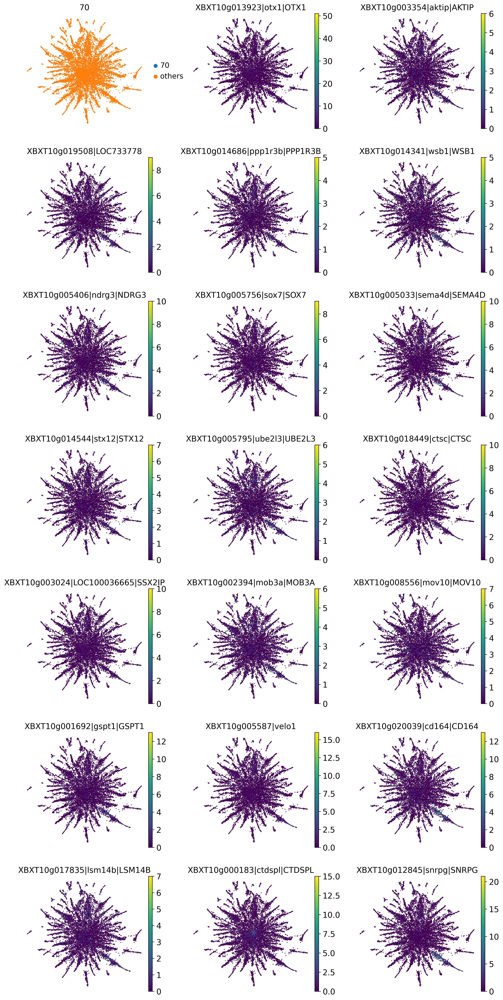

In [165]:
%matplotlib inline
sc.set_figure_params(dpi=150, scanpy=True)
num_genes = 20

adata.obs["cur_cluster"] = "others"
adata.obs.loc[adata.obs[cur_leiden] == cluster, "cur_cluster"] = cluster
colors = ["cur_cluster"] + list(marker_genes.iloc[0:num_genes, 0])
titles = [cluster] + list(marker_genes.loc[:,gene_symbols].iloc[0:num_genes])

sc.pl.umap(
    adata,
    color=colors,
    title=titles,
    frameon=False,
    ncols=3,
    use_raw=True,
    cmap='viridis',
)

## GSEA

In [22]:
import decoupler
msigdb = decoupler.get_resource("MSigDB")
msigdb.collection.unique()

array(['chemical_and_genetic_perturbations', 'immunesigdb',
       'mirna_targets_mirdb', 'go_molecular_function', 'tf_targets_gtrf',
       'tf_targets_legacy', 'oncogenic_signatures',
       'cell_type_signatures', 'vaccine_response',
       'go_biological_process', 'cancer_gene_neighborhoods',
       'cancer_modules', 'go_cellular_component', 'wikipathways',
       'reactome_pathways', 'hallmark', 'mirna_targets_legacy',
       'biocarta_pathways', 'positional', 'human_phenotype_ontology',
       'pid_pathways', 'kegg_pathways'], dtype=object)

In [23]:
cell_type_signatures = msigdb.query("collection == 'cell_type_signatures'").copy()
go_molecular_function = msigdb.query("collection == 'go_molecular_function'").copy()
reactome = msigdb.query("collection == 'reactome_pathways'").copy()


In [24]:
cur_collection = reactome
cur_collection.drop_duplicates(["genesymbol", "geneset"], inplace=True)
cur_collection

,genesymbol,collection,geneset
200,MAFF,reactome_pathways,REACTOME_HEMOSTASIS
342,MAFF,reactome_pathways,REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEV...
718,IER3,reactome_pathways,REACTOME_INTRACELLULAR_SIGNALING_BY_SECOND_MES...
859,IER3,reactome_pathways,REACTOME_NEGATIVE_REGULATION_OF_THE_PI3K_AKT_N...
1104,PHLDA1,reactome_pathways,REACTOME_MITOTIC_G2_G2_M_PHASES
...,...,...,...
3838483,KIR2DS2,reactome_pathways,REACTOME_DAP12_INTERACTIONS
3838489,KIR2DS2,reactome_pathways,REACTOME_INNATE_IMMUNE_SYSTEM
3838499,KIR2DS2,reactome_pathways,REACTOME_ADAPTIVE_IMMUNE_SYSTEM
3838530,KIR3DS1,reactome_pathways,REACTOME_DAP12_INTERACTIONS


In [25]:
geneset_size = cur_collection.groupby("geneset").size()
cur_collection_genesets = geneset_size.index[(geneset_size > 5) & (geneset_size < 500)]

In [26]:
t_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, cluster, key=cur_leiden, gene_symbols="human_gene_symbol")
    # Subset to highly variable genes
    .set_index("human_gene_symbol")
#     .loc[adata_kotov_s22.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis([cur_leiden], axis=1)
)
t_stats

leiden_1,scores
human_gene_symbol,
RPS14,22.540289
UQCR11,22.302879
SNRPG,22.244116
RPL15,22.140896
RPS15,22.107918
...,...
APOL3,-0.001078
TRBV10-1,-0.001078
ADORA2A,-0.001078


In [27]:
scores, norm, pvals = decoupler.run_gsea(
    t_stats.T,
    cur_collection[cur_collection["geneset"].isin(cur_collection_genesets)],
    source="geneset",
    target="genesymbol"
)

gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

/home/ksp503/.conda/envs/xenopus/lib/python3.10/site-packages/seaborn/_core/plot.py:941: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.savefig(buffer, dpi=dpi * 2, format="png", bbox_inches="tight")


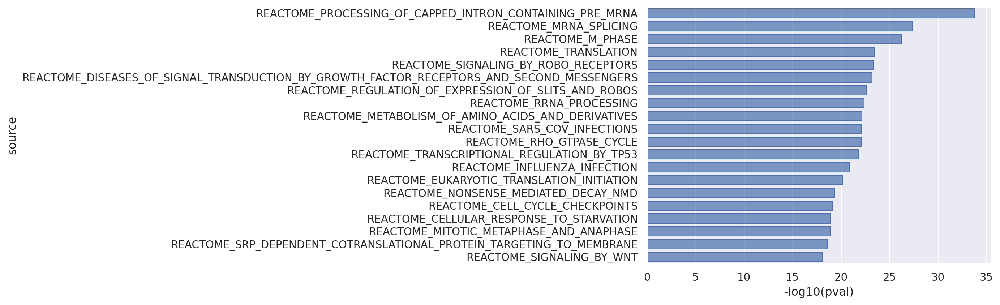

In [28]:
(
    so.Plot(
        data=(
            gsea_results.loc[(gsea_results.pval < 0.05) & (gsea_results.score > 0), :].sort_values("pval", ascending=True).head(20).assign(
                **{"-log10(pval)": lambda x: -np.log10(x["pval"])}
            )
        ),
        x="-log10(pval)",
        y="source",
    ).add(so.Bar())
)

In [29]:
gsea_results.loc[(gsea_results.pval < 0.05) & (gsea_results.score > 0), :].sort_values("score", ascending=False).head(40)

,score,norm,pval
source,,,
REACTOME_MODULATION_BY_MTB_OF_HOST_IMMUNE_SYSTEM,0.967457,2.364326,1.806293e-02
REACTOME_FLT3_SIGNALING_BY_CBL_MUTANTS,0.931332,2.495603,1.257433e-02
REACTOME_SARS_COV_1_MODULATES_HOST_TRANSLATION_MACHINERY,0.909688,5.648701,1.616646e-08
REACTOME_TRANSPORT_OF_CONNEXONS_TO_THE_PLASMA_MEMBRANE,0.896309,2.253409,2.423339e-02
REACTOME_SLBP_DEPENDENT_PROCESSING_OF_REPLICATION_DEPENDENT_HISTONE_PRE_MRNAS,0.883955,2.897819,3.757673e-03
REACTOME_SARS_COV_2_MODULATES_HOST_TRANSLATION_MACHINERY,0.883834,6.099357,1.064962e-09
REACTOME_EUKARYOTIC_TRANSLATION_ELONGATION,0.882667,8.711257,3.005235e-18
REACTOME_INLA_MEDIATED_ENTRY_OF_LISTERIA_MONOCYTOGENES_INTO_HOST_CELLS,0.878905,2.740648,6.131820e-03
REACTOME_REGULATION_OF_PTEN_LOCALIZATION,0.876661,2.627161,8.610064e-03


In [87]:
reactome.loc[reactome.geneset == "REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT_DURING_GASTRULATION", :]

,genesymbol,collection,geneset
291840,CDH1,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
562598,CLDN7,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
1249209,FGFR1,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
1298491,EOMES,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
2894453,SNAI1,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
3241163,OCLN,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...
3442705,TBXT,reactome_pathways,REACTOME_EPITHELIAL_MESENCHYMAL_TRANSITION_EMT...


# Discard some clusters

In [150]:
adata.shape

(17045, 20289)

In [151]:
# bad_clusters = [str(cl) for cl in [0, 1, 3, 4, 5]]
adata = adata[~adata.obs[cur_leiden].isin(bad_clusters), :]
# acts = acts[~acts.obs[cur_leiden].isin(bad_clusters), :]
adata

View of AnnData object with n_obs × n_vars = 13633 × 20289
    obs: 'lib', 'nUMI_per_cell', 'ngenes_per_cell', 'inDrops_version', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'cell_barcode', 'cell_barcode_v', 'Library_name', 'barcodes_unique', 'Celltype_transferred', 'Celltype_known', 'Celltype_transferred_short', 'Celltype_barcode', 'leiden_0.2', 'cur_cluster', 'leiden_0.5', 'leiden_1', 'leiden_2'
    var: 'gene_name', 'human_id', 'human_name', 'human_desc', 'eval_forward', 'eval_backward', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', '

# Reannotation

In [112]:
train_target, inferred_target

NameError: name 'inferred_target' is not defined

In [166]:
inferred_target = "Celltype_by_cluster"

In [167]:
adata.obs[inferred_target] = "blastula"

In [168]:
cluster_celltype = {
    "70": "germ cell"
}

adata.obs[inferred_target] = adata.obs[inferred_target].astype("str")

for cluster, cell_type in cluster_celltype.items():
    adata.obs.loc[adata.obs[cur_leiden] == cluster, inferred_target] = cell_type
    
adata.obs[inferred_target] = adata.obs[inferred_target].astype("category")

In [169]:
adata.obs[inferred_target].value_counts()

Celltype_by_cluster
blastula     13623
germ cell       10
Name: count, dtype: int64

# Checkpoint 2

In [170]:
adata_fp = os.path.join(DATA_DIR, "adata", f"all.{NF_stage}.realigned.corrected.transferred.clustered.reannotated.h5ad")
adata.write(adata_fp)

In [121]:
adata

View of AnnData object with n_obs × n_vars = 17045 × 20289
    obs: 'lib', 'nUMI_per_cell', 'ngenes_per_cell', 'inDrops_version', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'cell_barcode', 'cell_barcode_v', 'Library_name', 'barcodes_unique', 'Celltype_transferred', 'Celltype_known', 'Celltype_transferred_short', 'Celltype_barcode', 'leiden_0.2', 'cur_cluster', 'leiden_0.5', 'leiden_1'
    var: 'gene_name', 'human_id', 'human_name', 'human_desc', 'eval_forward', 'eval_backward', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_no

In [24]:
NF_stage

'S8'